## Importing Data

Here are what the columns represent:
* credit.policy: 1 if the customer meets the credit underwriting criteria of LendingClub.com, and 0 otherwise.
* purpose: The purpose of the loan (takes values "credit_card", "debt_consolidation", "educational", "major_purchase", "small_business", and "all_other").
* int.rate: The interest rate of the loan, as a proportion (a rate of 11% would be stored as 0.11). Borrowers judged by LendingClub.com to be more risky are assigned higher interest rates.
* installment: The monthly installments owed by the borrower if the loan is funded.
* log.annual.inc: The natural log of the self-reported annual income of the borrower.
* dti: The debt-to-income ratio of the borrower (amount of debt divided by annual income).
* fico: The FICO credit score of the borrower.
* days.with.cr.line: The number of days the borrower has had a credit line.
* revol.bal: The borrower's revolving balance (amount unpaid at the end of the credit card billing cycle).
* revol.util: The borrower's revolving line utilization rate (the amount of the credit line used relative to total credit available).
* inq.last.6mths: The borrower's number of inquiries by creditors in the last 6 months.
* delinq.2yrs: The number of times the borrower had been 30+ days past due on a payment in the past 2 years.
* pub.rec: The borrower's number of derogatory public records (bankruptcy filings, tax liens, or judgments).

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import math

sb.set()

In [2]:
rawData = pd.read_csv("loan_data.csv")
rawData.head(10)

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0
5,1,credit_card,0.0788,125.13,11.904968,16.98,727,6120.041667,50807,51.0,0,0,0,0
6,1,debt_consolidation,0.1496,194.02,10.714418,4.00,667,3180.041667,3839,76.8,0,0,1,1
7,1,all_other,0.1114,131.22,11.002100,11.08,722,5116.000000,24220,68.6,0,0,0,1
8,1,home_improvement,0.1134,87.19,11.407565,17.25,682,3989.000000,69909,51.1,1,0,0,0
9,1,debt_consolidation,0.1221,84.12,10.203592,10.00,707,2730.041667,5630,23.0,1,0,0,0


In [3]:
rawData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9578 non-null   int64  
 1   purpose            9578 non-null   object 
 2   int.rate           9578 non-null   float64
 3   installment        9578 non-null   float64
 4   log.annual.inc     9578 non-null   float64
 5   dti                9578 non-null   float64
 6   fico               9578 non-null   int64  
 7   days.with.cr.line  9578 non-null   float64
 8   revol.bal          9578 non-null   int64  
 9   revol.util         9578 non-null   float64
 10  inq.last.6mths     9578 non-null   int64  
 11  delinq.2yrs        9578 non-null   int64  
 12  pub.rec            9578 non-null   int64  
 13  not.fully.paid     9578 non-null   int64  
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


## Exploratory Anaylsis + Quick Data Cleaning

### Convert purpose to workable data
Notice that purpose is catagorical data
Lets convert into individual columns

In [4]:
rawData["purpose"].value_counts()

debt_consolidation    3957
all_other             2331
credit_card           1262
home_improvement       629
small_business         619
major_purchase         437
educational            343
Name: purpose, dtype: int64

In [5]:
rawData = pd.get_dummies(rawData,columns=["purpose"],drop_first=True)
rawData.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,0,1,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0,1,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,0,1,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,0,1,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0,1,0,0,0,0,0


### Convert days to int  
Notice that days are as float. Seems to be a data rounding error.  
So round and convert to int type

In [6]:
rawData["days.with.cr.line"] = rawData["days.with.cr.line"].round().astype(int)
rawData.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737,5640,28854,52.1,0,0,0,0,0,1,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707,2760,33623,76.7,0,0,0,0,1,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682,4710,3511,25.6,1,0,0,0,0,1,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712,2700,33667,73.2,1,0,0,0,0,1,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667,4066,4740,39.5,0,1,0,0,1,0,0,0,0,0


### Convert annual income to linear scale
Notice that log.annual.inc is in log scaling  
Create a new column in linear scale

Do this to see if there is any correlation that will be left undiscovered in log scale

In [7]:
rawData["annual.inc"] = rawData["log.annual.inc"].apply(lambda x:math.exp(x))
rawData.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business,annual.inc
0,1,0.1189,829.10,11.350407,19.48,737,5640,28854,52.1,0,0,0,0,0,1,0,0,0,0,85000.000385
1,1,0.1071,228.22,11.082143,14.29,707,2760,33623,76.7,0,0,0,0,1,0,0,0,0,0,65000.000073
2,1,0.1357,366.86,10.373491,11.63,682,4710,3511,25.6,1,0,0,0,0,1,0,0,0,0,31999.999943
3,1,0.1008,162.34,11.350407,8.10,712,2700,33667,73.2,1,0,0,0,0,1,0,0,0,0,85000.000385
4,1,0.1426,102.92,11.299732,14.97,667,4066,4740,39.5,0,1,0,0,1,0,0,0,0,0,80799.999636


In [8]:
rawData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   credit.policy               9578 non-null   int64  
 1   int.rate                    9578 non-null   float64
 2   installment                 9578 non-null   float64
 3   log.annual.inc              9578 non-null   float64
 4   dti                         9578 non-null   float64
 5   fico                        9578 non-null   int64  
 6   days.with.cr.line           9578 non-null   int32  
 7   revol.bal                   9578 non-null   int64  
 8   revol.util                  9578 non-null   float64
 9   inq.last.6mths              9578 non-null   int64  
 10  delinq.2yrs                 9578 non-null   int64  
 11  pub.rec                     9578 non-null   int64  
 12  not.fully.paid              9578 non-null   int64  
 13  purpose_credit_card         9578 

### Data Exploration
Data should be ready to use.  
Do data exploration

In [9]:
#Create a sepearte copy of input data
data = rawData.copy()

In [10]:
#Create a list of numeric data
numeric_data = ["int.rate","installment","log.annual.inc","dti","fico","days.with.cr.line","revol.bal","revol.util","annual.inc","inq.last.6mths","delinq.2yrs","pub.rec"]

### Categorical Data
Take a quick look at categorical data

In [11]:
data["credit.policy"].value_counts()

1    7710
0    1868
Name: credit.policy, dtype: int64

In [12]:
data["not.fully.paid"].value_counts()

0    8045
1    1533
Name: not.fully.paid, dtype: int64

### Continuous Data
Do a quick pairplot of all numeric data

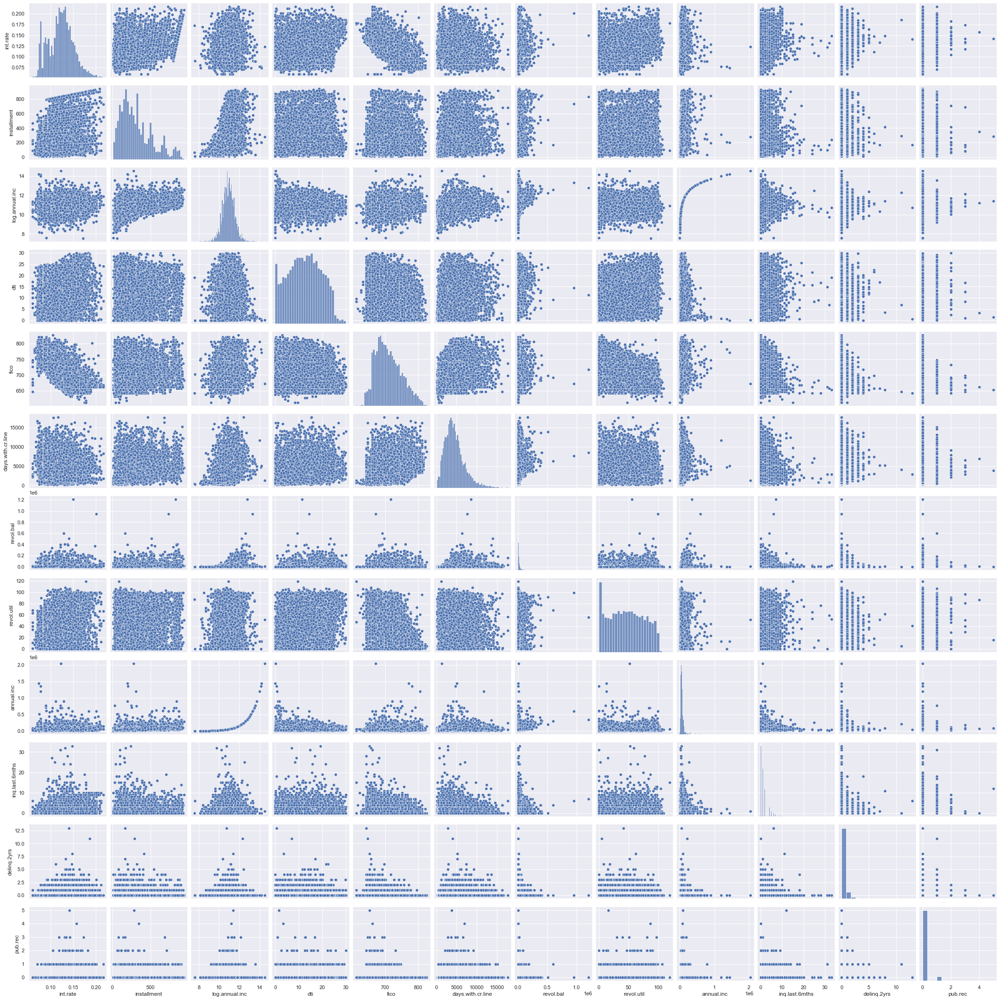

In [13]:
sb.pairplot(data = data[numeric_data])

### Trimming Outliers
Notice that there are extreme outliers in revol.bal and annual.inc  
It will not allow us to clearly see the relationship of the rest of the data points  
Can temporarily trim off in exploratory analysis to identify correlations and then use these data later in modelling

#### Trim revol.bal 

<AxesSubplot:xlabel='revol.bal', ylabel='Count'>

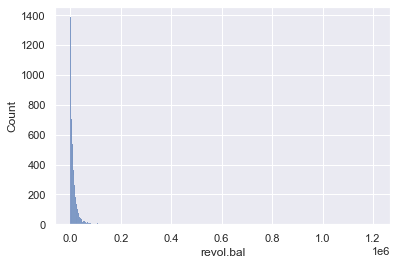

In [14]:
sb.histplot(data["revol.bal"])

In [15]:
data[data["revol.bal"]>data["revol.bal"].quantile(0.99)]

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business,annual.inc
7799,0,0.1691,489.61,13.122363,7.47,667,3600,168496,46.1,2,1,0,1,1,0,0,0,0,0,500000.001298
7838,0,0.1249,167.24,12.100712,21.35,692,6047,222702,30.5,0,0,0,0,1,0,0,0,0,0,180000.000023
7953,0,0.1407,855.30,12.043554,20.20,687,5774,216959,45.4,4,0,0,0,0,0,0,0,0,1,170000.000674
7987,0,0.1312,843.80,12.429216,25.03,762,8460,401941,20.7,1,0,0,1,0,0,0,0,0,1,250000.000789
8014,0,0.1501,866.76,12.128111,24.59,697,6510,245886,84.5,7,0,0,1,0,1,0,0,0,0,184999.999249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9551,0,0.1348,508.87,11.736069,16.85,707,7440,206877,92.5,1,0,0,1,0,0,0,1,0,0,125000.000464
9553,0,0.1385,545.67,11.775290,10.80,697,4110,197716,74.9,4,0,0,0,0,1,0,0,0,0,130000.000073
9557,0,0.1025,466.35,12.206073,13.97,722,6120,338935,78.3,2,0,0,0,1,0,0,0,0,0,200000.000894
9564,0,0.1385,511.56,12.323856,12.33,687,6420,385489,51.2,4,0,0,0,0,0,0,0,0,0,224999.999733


<AxesSubplot:xlabel='revol.bal', ylabel='Count'>

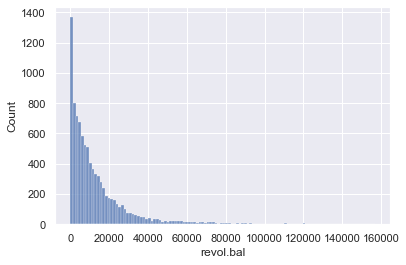

In [16]:
sb.histplot(data[data["revol.bal"]<data["revol.bal"].quantile(0.99)]["revol.bal"])

In [17]:
#Remove top 1% of data
data = data[data["revol.bal"]<data["revol.bal"].quantile(0.99)]

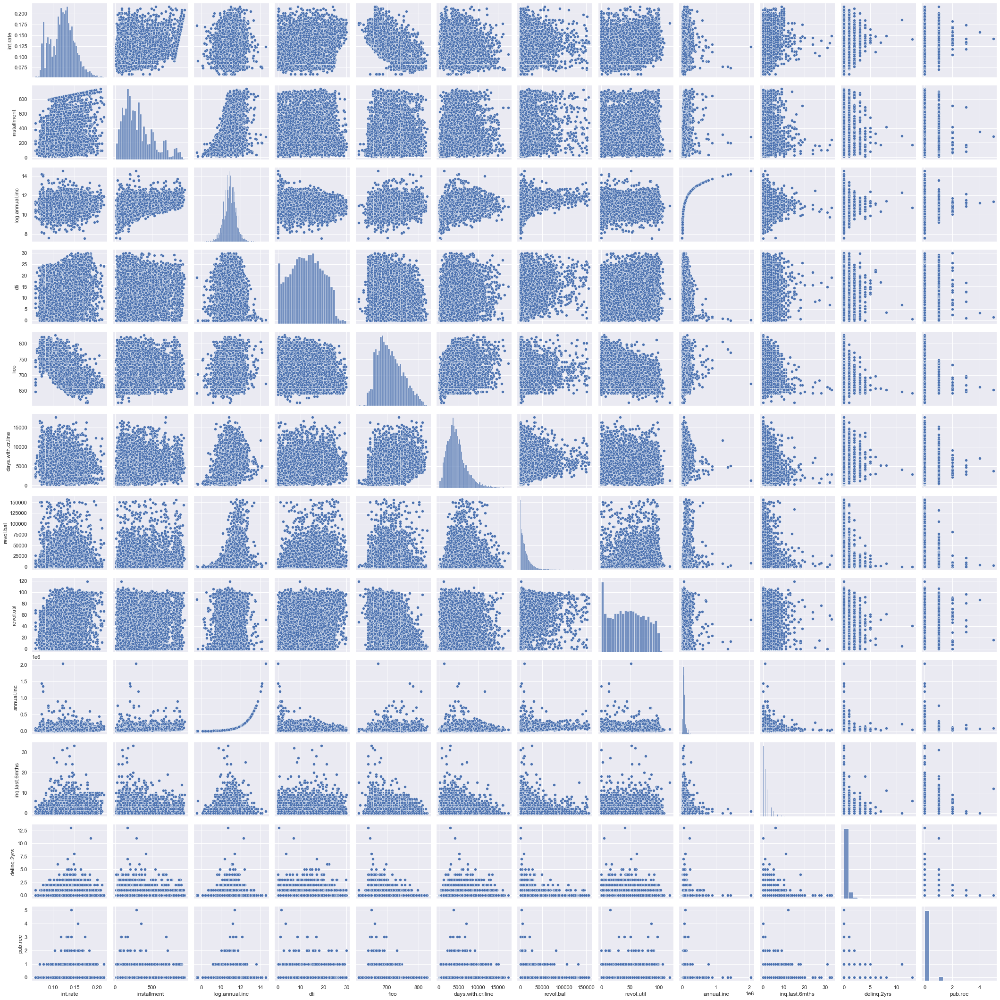

In [18]:
sb.pairplot(data = data[numeric_data])

#### Trim annual.inc
Annual income outliers are not the same as revol.bal outliers

<AxesSubplot:xlabel='annual.inc', ylabel='Count'>

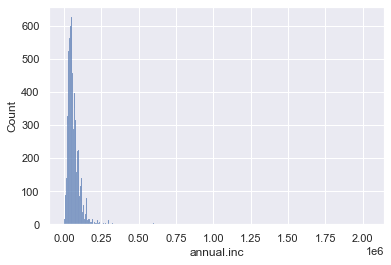

In [19]:
sb.histplot(data["annual.inc"])

In [20]:
#Remove top 1%
data = data[data["annual.inc"]<data["annual.inc"].quantile(0.99)]

### Check correlation between features
Now that outliers are removed, we can observe teh correlation between features

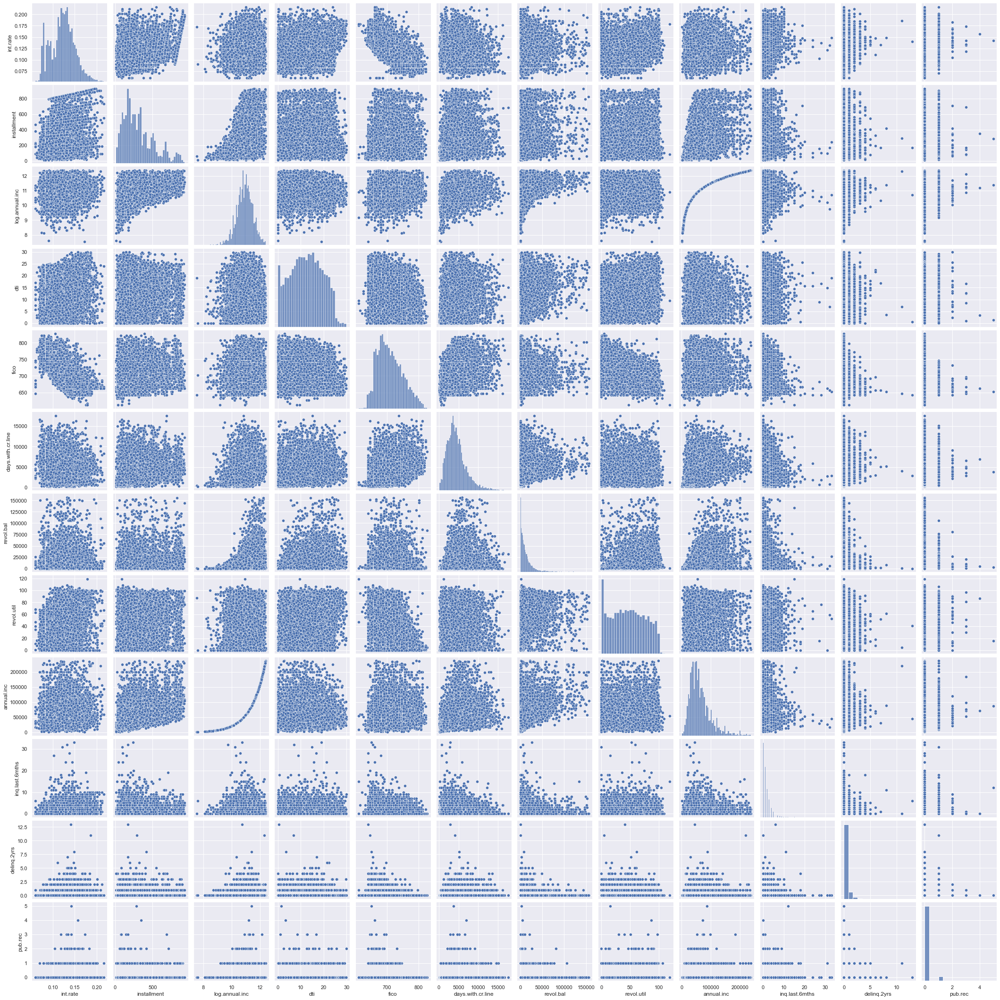

In [21]:
sb.pairplot(data = data[numeric_data])

In [22]:
data[numeric_data].corr()

,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,annual.inc,inq.last.6mths,delinq.2yrs,pub.rec
int.rate,1.000000,0.267333,0.047673,0.219200,-0.718876,-0.132809,0.104305,0.463760,0.051367,0.200377,0.156377,0.101577
installment,0.267333,1.000000,0.442359,0.049952,0.086082,0.168053,0.255865,0.078345,0.420638,-0.021709,-0.003309,-0.029165
log.annual.inc,0.047673,0.442359,1.000000,-0.031933,0.113782,0.335463,0.404871,0.054322,0.921145,0.013022,0.033029,0.023847
dti,0.219200,0.049952,-0.031933,1.000000,-0.241449,0.057128,0.285142,0.339435,-0.075001,0.029742,-0.022100,0.006831
fico,-0.718876,0.086082,0.113782,-0.241449,1.000000,0.263672,-0.048819,-0.541393,0.108879,-0.187407,-0.216527,-0.148947
days.with.cr.line,-0.132809,0.168053,0.335463,0.057128,0.263672,1.000000,0.257945,-0.026190,0.312579,-0.049358,0.084827,0.076057
revol.bal,0.104305,0.255865,0.404871,0.285142,-0.048819,0.257945,1.000000,0.320782,0.430591,-0.010857,-0.051443,-0.044707
revol.util,0.463760,0.078345,0.054322,0.339435,-0.541393,-0.026190,0.320782,1.000000,0.035099,-0.015517,-0.043317,0.070408
annual.inc,0.051367,0.420638,0.921145,-0.075001,0.108879,0.312579,0.430591,0.035099,1.000000,0.017027,0.031460,0.011840
inq.last.6mths,0.200377,-0.021709,0.013022,0.029742,-0.187407,-0.049358,-0.010857,-0.015517,0.017027,1.000000,0.021976,0.076265


<AxesSubplot:>

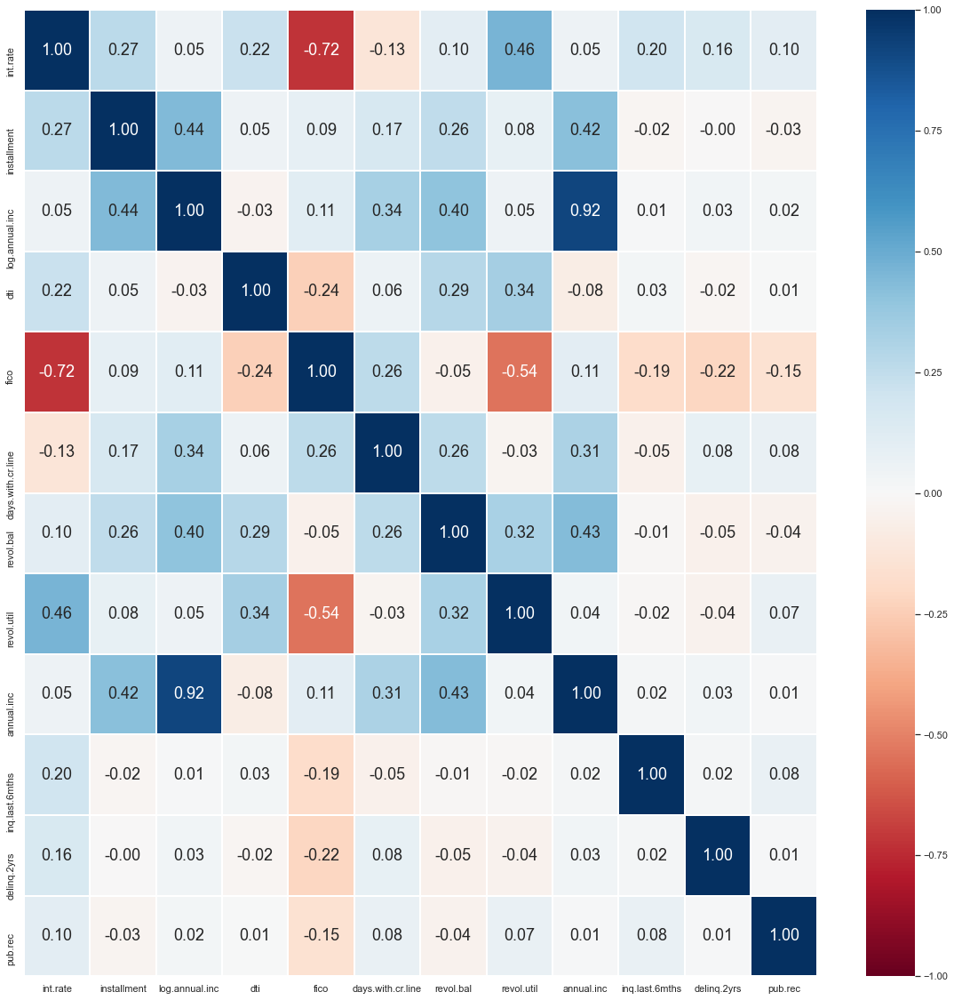

In [23]:
f = plt.figure(figsize=(20, 20))
sb.heatmap(data[numeric_data].corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

observe that there seems to be a decent correlation between int.rate and fico  
there is correlation between fico and revol.util but not very strong
can be used later to do prediction

## Further Exploratory Analysis
Explore if credit.policy impacts the data
Credit policy has 2 main groups which should have distinct differences

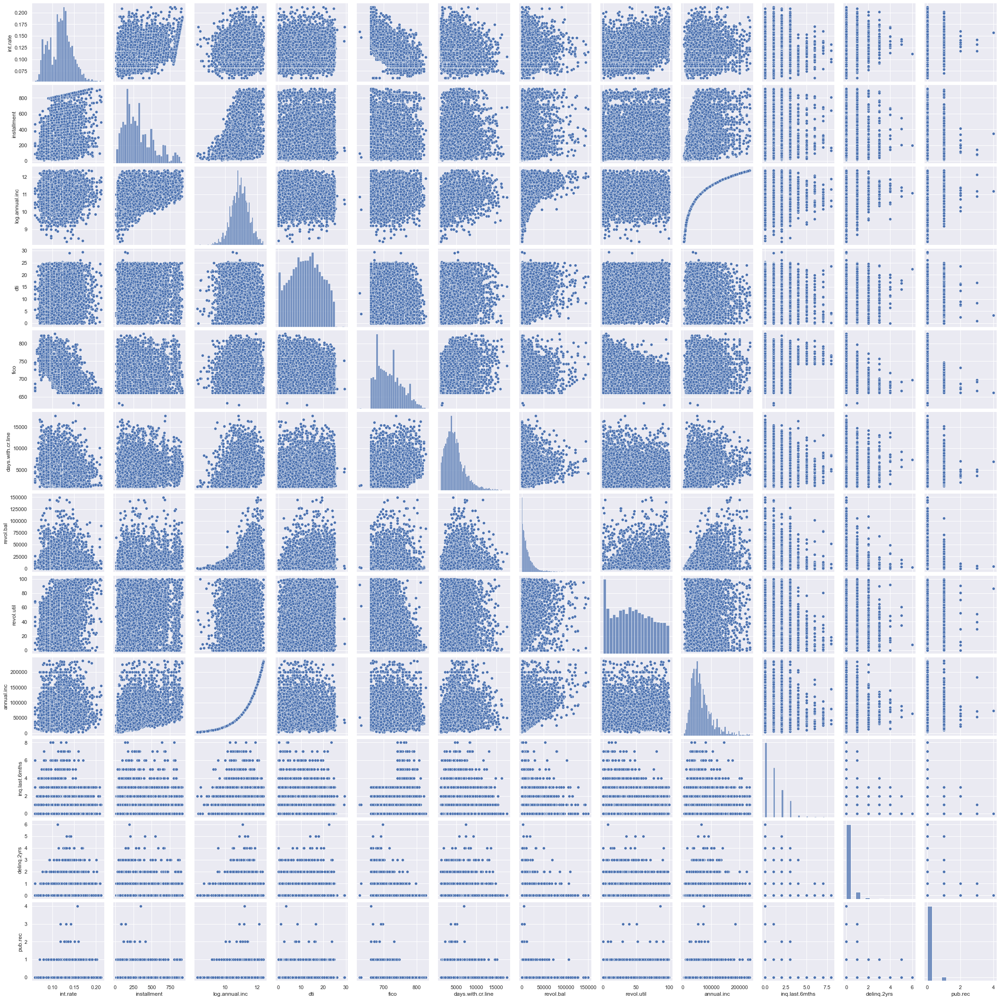

In [24]:
sb.pairplot(data[data["credit.policy"]==1][numeric_data])

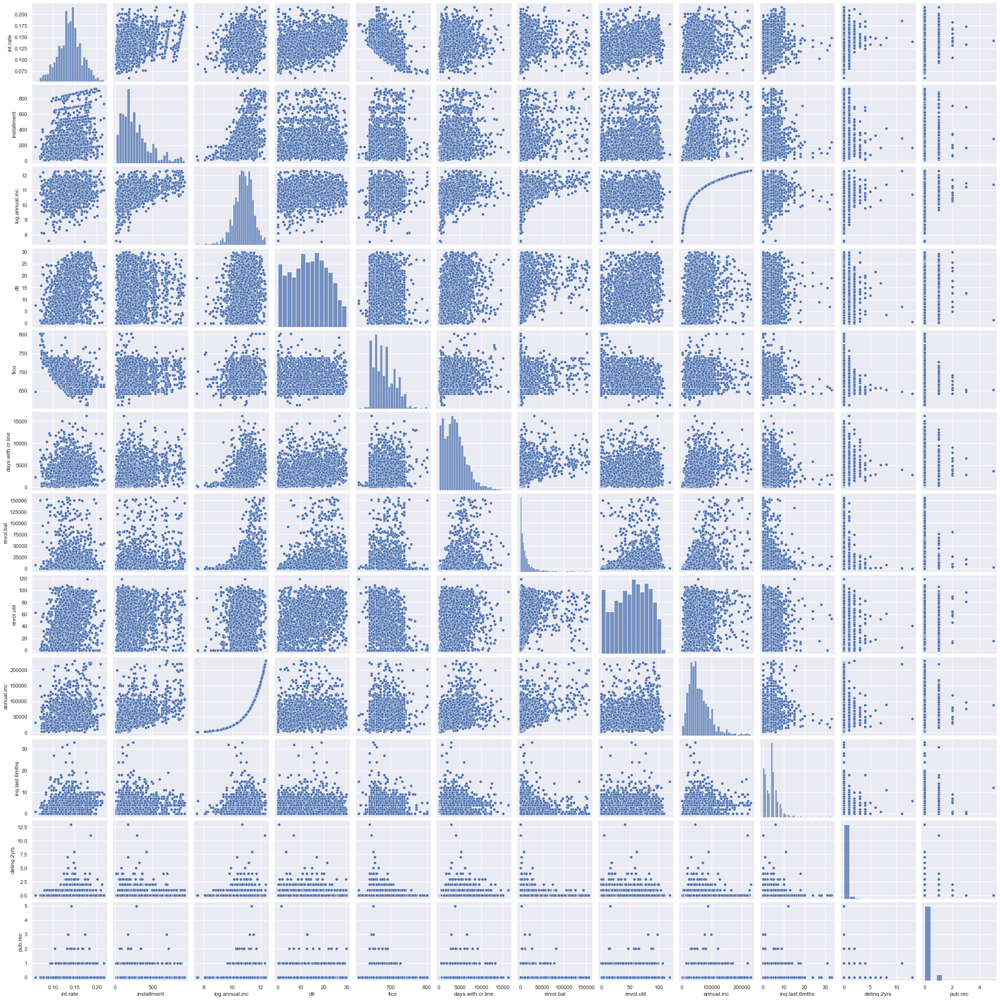

In [25]:
sb.pairplot(data[data["credit.policy"]==0][numeric_data])

does not seem to have a major difference

## Explore relation between int.rate and fico

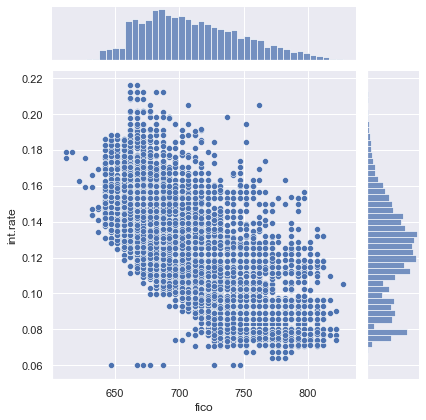

In [26]:
sb.jointplot(data=data,x="fico",y="int.rate")

### Impact of credit.policy on data

<AxesSubplot:xlabel='fico', ylabel='Count'>

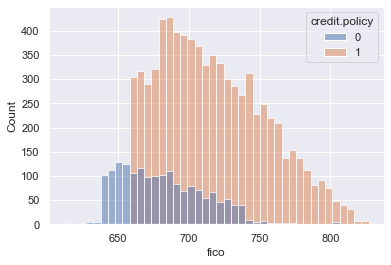

In [27]:
sb.histplot(data=data,x="fico",hue="credit.policy")

<AxesSubplot:xlabel='int.rate', ylabel='Count'>

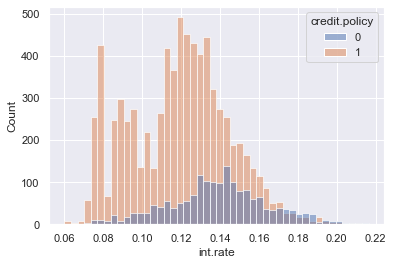

In [28]:
sb.histplot(data=data,x="int.rate",hue="credit.policy")

In [29]:
data[data["credit.policy"]==0][["fico","int.rate"]].corr()

,fico,int.rate
fico,1.000000,-0.510002
int.rate,-0.510002,1.000000


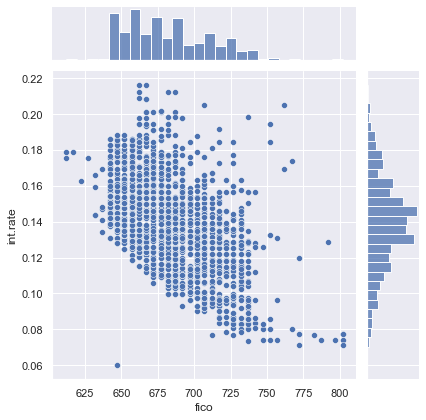

In [30]:
sb.jointplot(data=data[data["credit.policy"]==0],x="fico",y="int.rate")

In [31]:
data[data["credit.policy"]==1][["fico","int.rate"]].corr()

,fico,int.rate
fico,1.000000,-0.722107
int.rate,-0.722107,1.000000


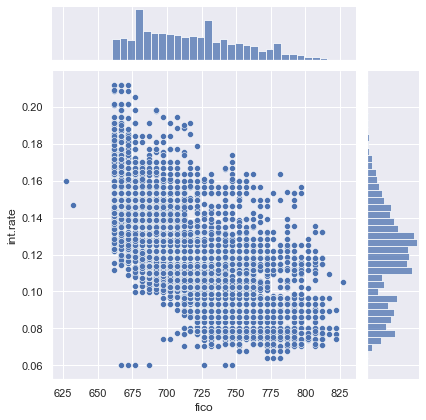

In [32]:
sb.jointplot(data=data[data["credit.policy"]==1],x="fico",y="int.rate")

### Explore relation between revol.util and fico

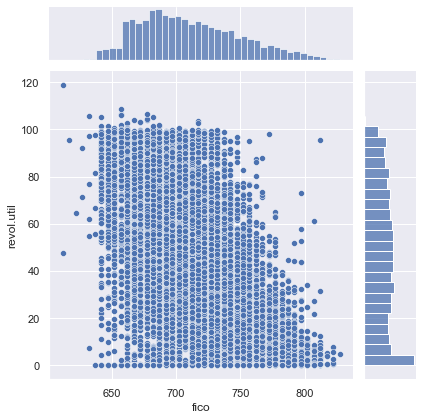

In [33]:
sb.jointplot(data=data,x="fico",y="revol.util")

Poor correlation between features

## Regression modelling
Lets use linear regression to predict interest rates using fico  
Take note use random_state = 1 for train test split to ensure consistency

In [34]:
#Grab a fresh set of rawData
data = rawData.copy()

In [35]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

### Univariate Linear Regression

In [36]:
x = pd.DataFrame(rawData["fico"])
y = pd.DataFrame(rawData["int.rate"])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25,random_state = 1)

In [37]:
# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(x_train,y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)

Intercept of Regression 	: b =  [0.48107027]
Coefficients of Regression 	: a =  [[-0.00050423]]


In [38]:
# Predict interest based on fico
y_train_pred = linreg.predict(x_train)
y_test_pred = linreg.predict(x_test)

In [39]:
# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(x_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(x_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.5082947194621608
Mean Squared Error (MSE) 	: 0.0003567797986206491

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.5191366438941312
Mean Squared Error (MSE) 	: 0.00033942318547391606



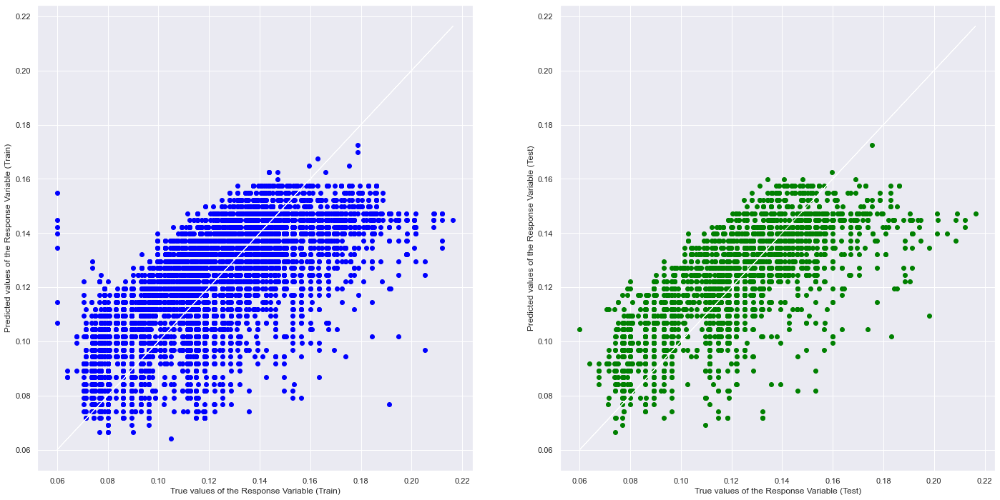

In [40]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

 ### Multivariate Linear Regression
 Lets try predicting with the feature with next highest correlation (revol.util)

In [41]:
# Extract Response and Predictors
y = pd.DataFrame(rawData["int.rate"])
# x = pd.DataFrame(rawData[["fico", "revol.util","dti","installment"]])
x = rawData.drop("int.rate",axis=1)

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25,random_state = 1)

In [42]:
# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(x_train,y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)

Intercept of Regression 	: b =  [0.46418373]
Coefficients of Regression 	: a =  [[-2.46526647e-03  4.21040456e-05 -1.77801752e-03  1.16701643e-04
  -4.79638841e-04  1.27157036e-07 -2.07467301e-08  8.32098302e-05
   6.30312466e-04  5.32682654e-04 -3.10543043e-06  2.64057240e-04
  -3.52410398e-03 -1.60539933e-03 -1.09473794e-04  2.67489890e-03
   1.86043716e-03  1.62541532e-02  6.27851132e-09]]


In [43]:
# Predict interest based on fico
y_train_pred = linreg.predict(x_train)
y_test_pred = linreg.predict(x_test)

In [44]:
# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(x_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(x_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.6554707934436725
Mean Squared Error (MSE) 	: 0.00024998930416131484

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.6804523570220444
Mean Squared Error (MSE) 	: 0.00022555654847274307



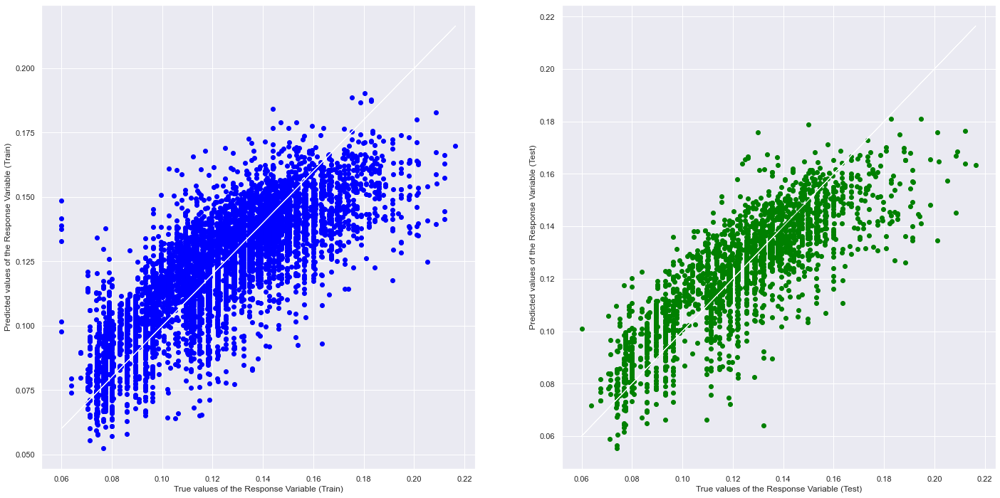

In [45]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

## Classification

In [46]:
# Import Decision Tree Classifier model from Scikit-Learn
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

### Univariate decision tree (depth = 2)
Lets try to use fico to predict credit policy

In [47]:
x = pd.DataFrame(rawData["fico"])
y = pd.DataFrame(rawData["credit.policy"])
# y = pd.DataFrame(rawData["not.fully.paid"])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25,random_state = 1)

<AxesSubplot:xlabel='fico', ylabel='credit.policy'>

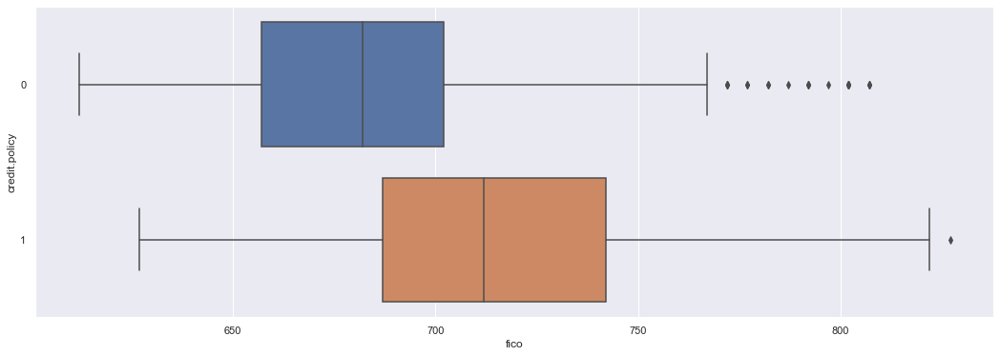

In [48]:
# Create a joint dataframe by concatenating predictor and response
trainDF = pd.concat([x, y], axis = 1).reindex(x.index)

# Joint Boxplot
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "fico", y = "credit.policy", data = trainDF, orient = "h")

In [49]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 2)

In [50]:
# Train the Decision Tree Classifier model
dectree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=2)

[Text(334.8, 543.6, 'fico <= 659.5\ngini = 0.317\nsamples = 7183\nvalue = [1419, 5764]\nclass = policy 1'),
 Text(167.4, 326.16, 'fico <= 634.5\ngini = 0.011\nsamples = 352\nvalue = [350, 2]\nclass = policy 0'),
 Text(83.7, 108.72000000000003, 'gini = 0.32\nsamples = 10\nvalue = [8, 2]\nclass = policy 0'),
 Text(251.10000000000002, 108.72000000000003, 'gini = 0.0\nsamples = 342\nvalue = [342, 0]\nclass = policy 0'),
 Text(502.20000000000005, 326.16, 'fico <= 734.5\ngini = 0.264\nsamples = 6831\nvalue = [1069, 5762]\nclass = policy 1'),
 Text(418.5, 108.72000000000003, 'gini = 0.322\nsamples = 4909\nvalue = [991, 3918]\nclass = policy 1'),
 Text(585.9, 108.72000000000003, 'gini = 0.078\nsamples = 1922\nvalue = [78, 1844]\nclass = policy 1')]

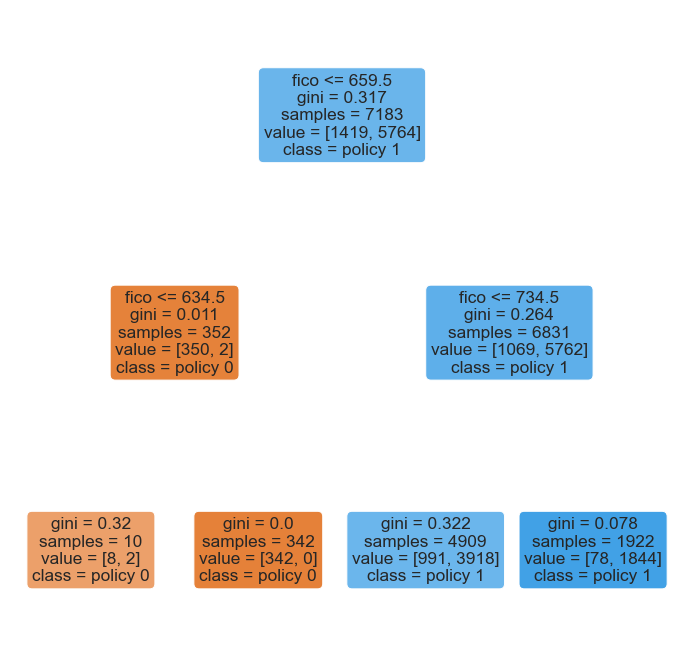

In [51]:
# Plot the trained Decision Tree
f = plt.figure(figsize=(12,12))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=["fico"], 
          class_names=["policy 0","policy 1"])

Classification Accuracy 	: 0.8508979535013226
              precision    recall  f1-score   support

           0       0.99      0.25      0.40      1419
           1       0.84      1.00      0.91      5764

    accuracy                           0.85      7183
   macro avg       0.92      0.62      0.66      7183
weighted avg       0.87      0.85      0.81      7183



<AxesSubplot:>

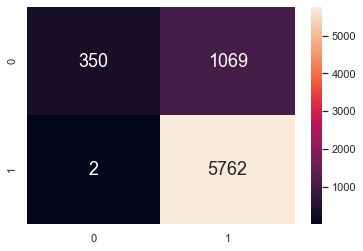

In [52]:
y_train_pred = dectree.predict(x_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_train, y_train))
print(classification_report(y_train,y_train_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.8697286012526096
              precision    recall  f1-score   support

           0       1.00      0.31      0.47       449
           1       0.86      1.00      0.93      1946

    accuracy                           0.87      2395
   macro avg       0.93      0.65      0.70      2395
weighted avg       0.89      0.87      0.84      2395



<AxesSubplot:>

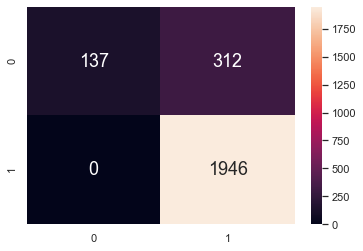

In [53]:
y_test_pred = dectree.predict(x_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_test, y_test))
print(classification_report(y_test,y_test_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

### Multivariate decision tree (depth = 2)
In the univariate tree, after 1 level, it is unable to differentiate further  
Lets use multiple variables

In [54]:
x = rawData.drop("credit.policy",axis=1)
y = pd.DataFrame(rawData["credit.policy"])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25,random_state = 1)

In [55]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 2)

In [56]:
# Train the Decision Tree Classifier model
dectree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=2)

[Text(334.8, 543.6, 'inq.last.6mths <= 3.5\ngini = 0.317\nsamples = 7183\nvalue = [1419, 5764]\nclass = policy 1'),
 Text(167.4, 326.16, 'fico <= 659.5\ngini = 0.173\nsamples = 6236\nvalue = [595, 5641]\nclass = policy 1'),
 Text(83.7, 108.72000000000003, 'gini = 0.015\nsamples = 259\nvalue = [257, 2]\nclass = policy 0'),
 Text(251.10000000000002, 108.72000000000003, 'gini = 0.107\nsamples = 5977\nvalue = [338, 5639]\nclass = policy 1'),
 Text(502.20000000000005, 326.16, 'fico <= 739.5\ngini = 0.226\nsamples = 947\nvalue = [824, 123]\nclass = policy 0'),
 Text(418.5, 108.72000000000003, 'gini = 0.0\nsamples = 806\nvalue = [806, 0]\nclass = policy 0'),
 Text(585.9, 108.72000000000003, 'gini = 0.223\nsamples = 141\nvalue = [18, 123]\nclass = policy 1')]

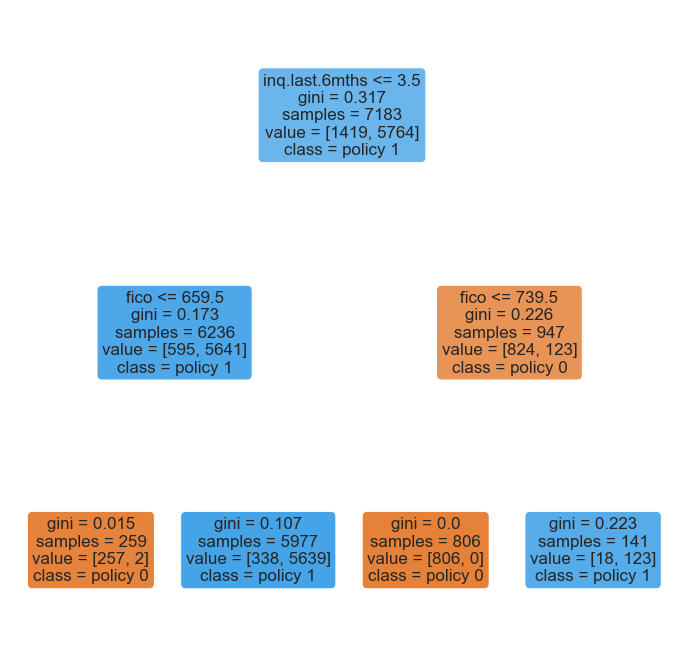

In [57]:
# Plot the trained Decision Tree
f = plt.figure(figsize=(12,12))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=x_train.columns, 
          class_names=["policy 0","policy 1"])

Classification Accuracy 	: 0.95016010023667
              precision    recall  f1-score   support

           0       1.00      0.75      0.86      1419
           1       0.94      1.00      0.97      5764

    accuracy                           0.95      7183
   macro avg       0.97      0.87      0.91      7183
weighted avg       0.95      0.95      0.95      7183



<AxesSubplot:>

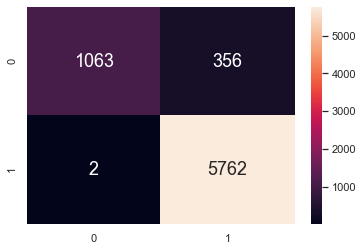

In [58]:
y_train_pred = dectree.predict(x_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_train, y_train))
print(classification_report(y_train,y_train_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.9528183716075157
              precision    recall  f1-score   support

           0       1.00      0.75      0.86       449
           1       0.95      1.00      0.97      1946

    accuracy                           0.95      2395
   macro avg       0.97      0.87      0.91      2395
weighted avg       0.96      0.95      0.95      2395



<AxesSubplot:>

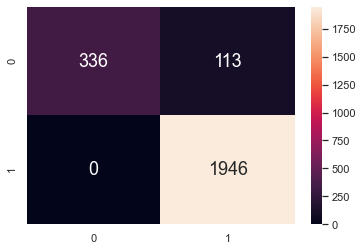

In [59]:
y_test_pred = dectree.predict(x_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_test, y_test))
print(classification_report(y_test,y_test_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

### Multivariate decision tree (depth = 5)
Lets try with greater depth

In [60]:
x = rawData.drop("credit.policy",axis=1)
y = pd.DataFrame(rawData["credit.policy"])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25,random_state = 1)

In [61]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 5)

In [62]:
# Train the Decision Tree Classifier model
dectree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=5)

[Text(372.0, 597.96, 'inq.last.6mths <= 3.5\ngini = 0.317\nsamples = 7183\nvalue = [1419, 5764]\nclass = policy 1'),
 Text(186.0, 489.24, 'fico <= 659.5\ngini = 0.173\nsamples = 6236\nvalue = [595, 5641]\nclass = policy 1'),
 Text(111.60000000000001, 380.52000000000004, 'fico <= 634.5\ngini = 0.015\nsamples = 259\nvalue = [257, 2]\nclass = policy 0'),
 Text(74.4, 271.8, 'days.with.cr.line <= 1304.0\ngini = 0.48\nsamples = 5\nvalue = [3, 2]\nclass = policy 0'),
 Text(37.2, 163.07999999999998, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]\nclass = policy 0'),
 Text(111.60000000000001, 163.07999999999998, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]\nclass = policy 1'),
 Text(148.8, 271.8, 'gini = 0.0\nsamples = 254\nvalue = [254, 0]\nclass = policy 0'),
 Text(260.40000000000003, 380.52000000000004, 'days.with.cr.line <= 1109.5\ngini = 0.107\nsamples = 5977\nvalue = [338, 5639]\nclass = policy 1'),
 Text(223.20000000000002, 271.8, 'gini = 0.0\nsamples = 130\nvalue = [130, 0]\nclass = policy 0'),
 

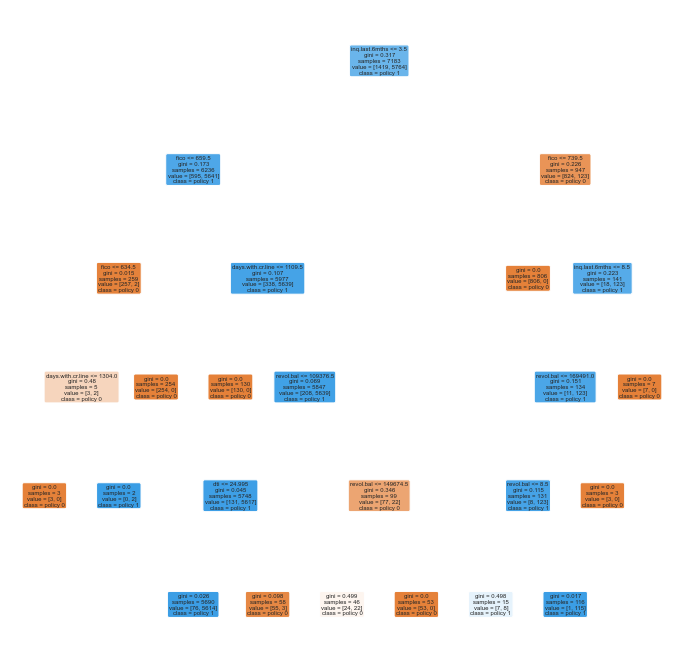

In [63]:
# Plot the trained Decision Tree
f = plt.figure(figsize=(12,12))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=x_train.columns, 
          class_names=["policy 0","policy 1"])

Classification Accuracy 	: 0.9848252819156341
              precision    recall  f1-score   support

           0       0.98      0.94      0.96      1419
           1       0.99      1.00      0.99      5764

    accuracy                           0.98      7183
   macro avg       0.98      0.97      0.98      7183
weighted avg       0.98      0.98      0.98      7183



<AxesSubplot:>

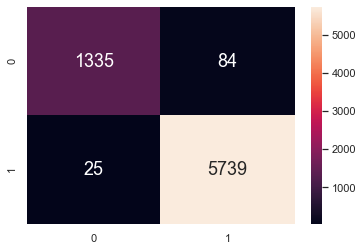

In [64]:
y_train_pred = dectree.predict(x_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_train, y_train))
print(classification_report(y_train,y_train_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.9908141962421712
              precision    recall  f1-score   support

           0       0.98      0.97      0.98       449
           1       0.99      1.00      0.99      1946

    accuracy                           0.99      2395
   macro avg       0.99      0.98      0.98      2395
weighted avg       0.99      0.99      0.99      2395



<AxesSubplot:>

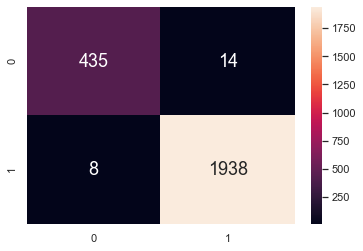

In [65]:
y_test_pred = dectree.predict(x_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_test, y_test))
print(classification_report(y_test,y_test_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## Predict not.fully.paid

### Multivariate decision tree (depth = 2)

In [66]:
x = rawData.drop("not.fully.paid",axis=1)
y = pd.DataFrame(rawData["not.fully.paid"])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25,random_state = 1)

In [67]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 2)

In [68]:
# Train the Decision Tree Classifier model
dectree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=2)

[Text(334.8, 543.6, 'credit.policy <= 0.5\ngini = 0.265\nsamples = 7183\nvalue = [6053, 1130]\nclass = not paid'),
 Text(167.4, 326.16, 'purpose_small_business <= 0.5\ngini = 0.401\nsamples = 1419\nvalue = [1026, 393]\nclass = not paid'),
 Text(83.7, 108.72000000000003, 'gini = 0.389\nsamples = 1316\nvalue = [968, 348]\nclass = not paid'),
 Text(251.10000000000002, 108.72000000000003, 'gini = 0.492\nsamples = 103\nvalue = [58, 45]\nclass = not paid'),
 Text(502.20000000000005, 326.16, 'int.rate <= 0.093\ngini = 0.223\nsamples = 5764\nvalue = [5027, 737]\nclass = not paid'),
 Text(418.5, 108.72000000000003, 'gini = 0.097\nsamples = 1194\nvalue = [1133, 61]\nclass = not paid'),
 Text(585.9, 108.72000000000003, 'gini = 0.252\nsamples = 4570\nvalue = [3894, 676]\nclass = not paid')]

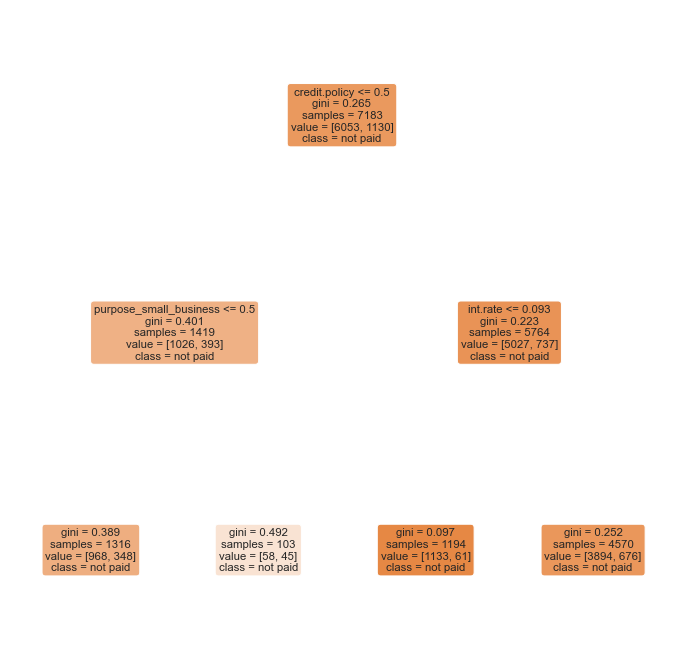

In [69]:
# Plot the trained Decision Tree
f = plt.figure(figsize=(12,12))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=x_train.columns, 
          class_names=["not paid","paid"])

Classification Accuracy 	: 0.8426841152721704
              precision    recall  f1-score   support

           0       0.84      1.00      0.91      6053
           1       0.00      0.00      0.00      1130

    accuracy                           0.84      7183
   macro avg       0.42      0.50      0.46      7183
weighted avg       0.71      0.84      0.77      7183



C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<AxesSubplot:>

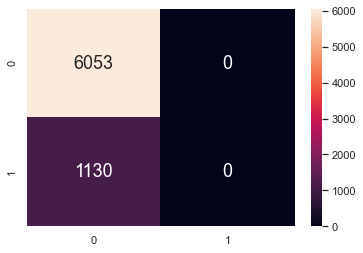

In [70]:
y_train_pred = dectree.predict(x_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_train, y_train))
print(classification_report(y_train,y_train_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.8317327766179541
              precision    recall  f1-score   support

           0       0.83      1.00      0.91      1992
           1       0.00      0.00      0.00       403

    accuracy                           0.83      2395
   macro avg       0.42      0.50      0.45      2395
weighted avg       0.69      0.83      0.76      2395



C:\Users\user\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<AxesSubplot:>

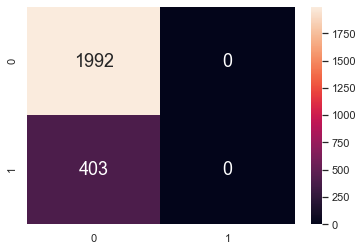

In [71]:
y_test_pred = dectree.predict(x_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_test, y_test))
print(classification_report(y_test,y_test_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

### Multivariate decision tree (depth = 4)

In [72]:
x = rawData.drop("not.fully.paid",axis=1)
y = pd.DataFrame(rawData["not.fully.paid"])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25,random_state = 1)

In [73]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 4)

In [74]:
# Train the Decision Tree Classifier model
dectree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=4)

[Text(316.8642857142857, 587.0880000000001, 'credit.policy <= 0.5\ngini = 0.265\nsamples = 7183\nvalue = [6053, 1130]\nclass = not paid'),
 Text(155.44285714285715, 456.624, 'purpose_small_business <= 0.5\ngini = 0.401\nsamples = 1419\nvalue = [1026, 393]\nclass = not paid'),
 Text(95.65714285714286, 326.1600000000001, 'inq.last.6mths <= 5.5\ngini = 0.389\nsamples = 1316\nvalue = [968, 348]\nclass = not paid'),
 Text(47.82857142857143, 195.69600000000003, 'fico <= 729.5\ngini = 0.365\nsamples = 1008\nvalue = [766, 242]\nclass = not paid'),
 Text(23.914285714285715, 65.23200000000008, 'gini = 0.378\nsamples = 929\nvalue = [694, 235]\nclass = not paid'),
 Text(71.74285714285715, 65.23200000000008, 'gini = 0.162\nsamples = 79\nvalue = [72, 7]\nclass = not paid'),
 Text(143.4857142857143, 195.69600000000003, 'revol.util <= 88.75\ngini = 0.451\nsamples = 308\nvalue = [202, 106]\nclass = not paid'),
 Text(119.57142857142857, 65.23200000000008, 'gini = 0.436\nsamples = 280\nvalue = [190, 90]\

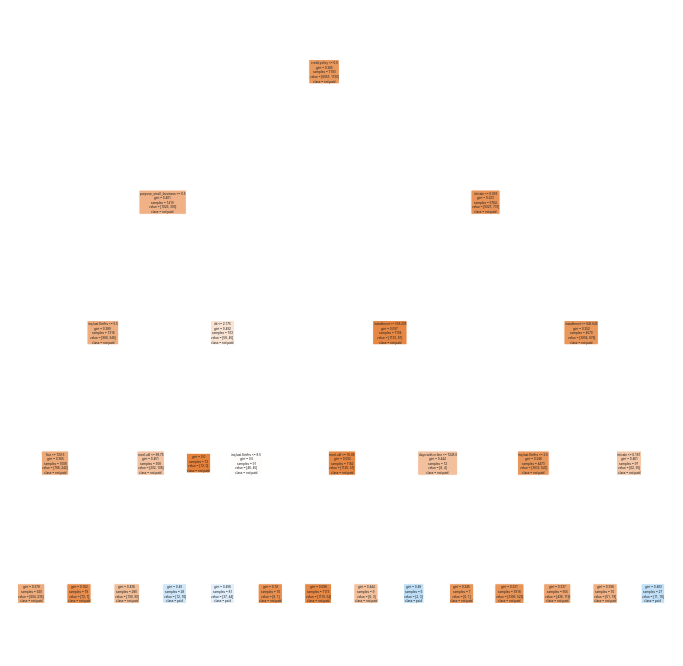

In [75]:
# Plot the trained Decision Tree
f = plt.figure(figsize=(12,12))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=x_train.columns, 
          class_names=["not paid","paid"])

Classification Accuracy 	: 0.845050814422943
              precision    recall  f1-score   support

           0       0.85      0.99      0.92      6053
           1       0.56      0.07      0.12      1130

    accuracy                           0.85      7183
   macro avg       0.71      0.53      0.52      7183
weighted avg       0.81      0.85      0.79      7183



<AxesSubplot:>

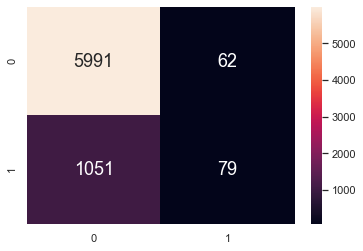

In [76]:
y_train_pred = dectree.predict(x_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_train, y_train))
print(classification_report(y_train,y_train_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.8250521920668058
              precision    recall  f1-score   support

           0       0.83      0.99      0.90      1992
           1       0.31      0.03      0.06       403

    accuracy                           0.83      2395
   macro avg       0.57      0.51      0.48      2395
weighted avg       0.75      0.83      0.76      2395



<AxesSubplot:>

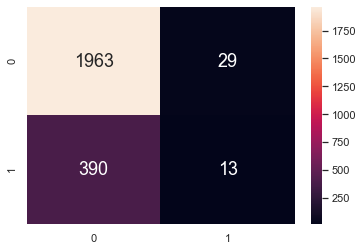

In [77]:
y_test_pred = dectree.predict(x_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree.score(x_test, y_test))
print(classification_report(y_test,y_test_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Test set accuracy went down  
Sign of overfitting

### Random Forest
Lets try using a randon forest classifier

In [78]:
from sklearn.ensemble import RandomForestClassifier

In [79]:
x = rawData.drop("not.fully.paid",axis=1)
y = rawData["not.fully.paid"]

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25,random_state = 1)

In [80]:
# Create a Random Forest Classifier object
rfc = RandomForestClassifier(n_estimators=600)

In [81]:
# Train the Random Forest Tree Classifier model
rfc.fit(x_train, y_train)

RandomForestClassifier(n_estimators=600)

Classification Accuracy 	: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6053
           1       1.00      1.00      1.00      1130

    accuracy                           1.00      7183
   macro avg       1.00      1.00      1.00      7183
weighted avg       1.00      1.00      1.00      7183



<AxesSubplot:>

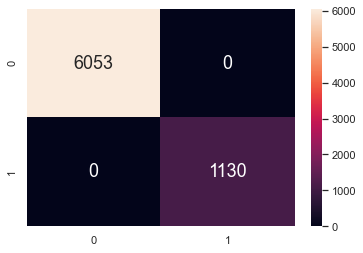

In [82]:
y_train_pred = rfc.predict(x_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", rfc.score(x_train, y_train))
print(classification_report(y_train,y_train_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.8296450939457203
              precision    recall  f1-score   support

           0       0.83      0.99      0.90      1992
           1       0.31      0.03      0.06       403

    accuracy                           0.83      2395
   macro avg       0.57      0.51      0.48      2395
weighted avg       0.75      0.83      0.76      2395



<AxesSubplot:>

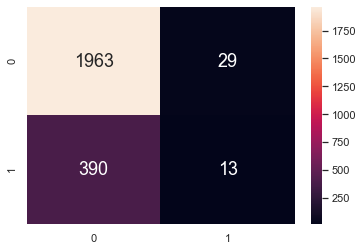

In [83]:
y_test_pred = dectree.predict(x_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", rfc.score(x_test, y_test))
print(classification_report(y_test,y_test_pred))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})